<a href="https://colab.research.google.com/github/NandiniLReddy/SpatialTrackingCVPR2024/blob/main/SpatialTrackerCVPR2024.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Spatial Tracker Deployed by Nandini Lokesh Reddy

##Clone the Spatial Tracker Repository

In [ ]:
!git clone https://github.com/facebookresearch/co-tracker
%cd co-tracker
!pip install -e .
!pip install opencv-python einops timm matplotlib moviepy flow_vis
!mkdir checkpoints
%cd checkpoints
!wget https://huggingface.co/facebook/cotracker/resolve/main/cotracker2.pth

Cloning into 'co-tracker'...
remote: Enumerating objects: 294, done.
remote: Counting objects: 100% (156/156), done.
remote: Compressing objects: 100% (75/75), done.
remote: Total 294 (delta 115), reused 83 (delta 81), pack-reused 138
Receiving objects: 100% (294/294), 52.67 MiB | 11.47 MiB/s, done.
Resolving deltas: 100% (144/144), done.
/content/co-tracker
Obtaining file:///content/co-tracker
  Preparing metadata (setup.py) ... done
  Running setup.py develop for cotracker
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.5/47.5 kB 4.7 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylin

##Import all the necessary packages

In [ ]:
%cd ..
import os
import torch

from base64 import b64encode
from cotracker.utils.visualizer import Visualizer, read_video_from_path
from IPython.display import HTML

/content/co-tracker


Read a video from CO3D:

In [ ]:
video = read_video_from_path('/content/FlightLanding.mp4')
video = torch.from_numpy(video).permute(0, 3, 1, 2)[None].float()

In [ ]:
def show_video(video_path):
    video_file = open(video_path, "r+b").read()
    video_url = f"data:video/mp4;base64,{b64encode(video_file).decode()}"
    return HTML(f"""<video width="640" height="480" autoplay loop controls><source src="{video_url}"></video>""")

show_video("/content/FlightLanding.mp4")

Import CoTrackerPredictor and create an instance of it.


In [ ]:
from cotracker.predictor import CoTrackerPredictor

model = CoTrackerPredictor(
    checkpoint=os.path.join(
        '/content/co-tracker/checkpoints/cotracker2.pth'
    )
)

In [ ]:
if torch.cuda.is_available():
    model = model.cuda()
    video = video.cuda()

Track points sampled on a regular grid of size 30\*30 on the first frame:

In [ ]:
pred_tracks, pred_visibility = model(video, grid_size=30)

Visualize and save the result:

In [ ]:
vis = Visualizer(save_dir='content', pad_value=100)
vis.visualize(video=video, tracks=pred_tracks, visibility=pred_visibility, filename='Flightteaser');

Video saved to content/Flightteaser.mp4


In [ ]:
show_video("/content/co-tracker/content/Flightteaser.mp4")

## Tracking manually selected points

In [ ]:
queries = torch.tensor([
    [0., 400., 350.],  # point tracked from the first frame
    [10., 600., 500.], # frame number 10
    [20., 750., 600.], # ...
    [30., 900., 200.]
])
if torch.cuda.is_available():
    queries = queries.cuda()

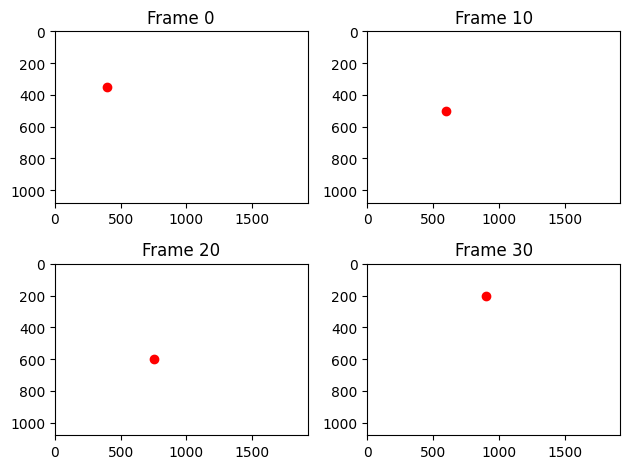

In [ ]:
import matplotlib.pyplot as plt
# Create a list of frame numbers corresponding to each point
frame_numbers = queries[:,0].int().tolist()

fig, axs = plt.subplots(2, 2)
axs = axs.flatten()

for i, (query, frame_number) in enumerate(zip(queries, frame_numbers)):
    ax = axs[i]
    ax.plot(query[1].item(), query[2].item(), 'ro')

    ax.set_title("Frame {}".format(frame_number))
    ax.set_xlim(0, video.shape[4])
    ax.set_ylim(0, video.shape[3])
    ax.invert_yaxis()

plt.tight_layout()
plt.show()

In [ ]:
pred_tracks, pred_visibility = model(video, queries=queries[None])

Finally, we visualize the results with tracks leaving traces from the frame where the tracking starts.
Color encodes time:

In [ ]:
vis = Visualizer(
    save_dir='content',
    linewidth=6,
    mode='cool',
    tracks_leave_trace=-1
)
vis.visualize(
    video=video,
    tracks=pred_tracks,
    visibility=pred_visibility,
    filename='flightqueries');

Video saved to content/flightqueries.mp4


In [ ]:
show_video("/content/co-tracker/content/flightqueries.mp4")

In [ ]:
pred_tracks, pred_visibility = model(video, queries=queries[None], backward_tracking=True)
vis.visualize(
    video=video,
    tracks=pred_tracks,
    visibility=pred_visibility,
    filename='flightqueries_backward');

Video saved to content/flightqueries_backward.mp4


In [ ]:
show_video("/content/co-tracker/content/flightqueries_backward.mp4")